---

<h1 style="color:#012eba">Introduction to Image Processing with Python</h1>
<h1 style="color:#012eba">Episode 1: Laying the Foundations: Understanding Digital Images, Formats, and Color Spaces</h1>

---

*DASCI 261 - Introduction to Image Processing*

*Prepared by Erika G. Lacson*

---

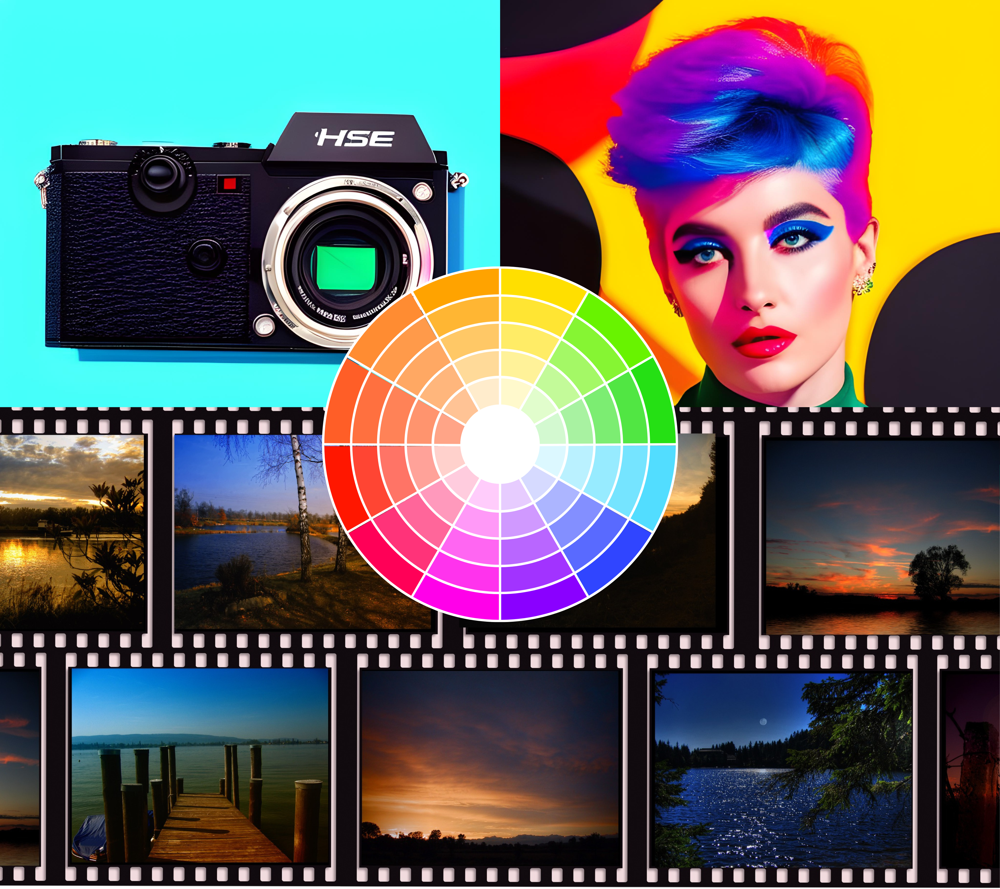

---
<h2 style="color:#ff0090">Introduction</h2>

Forget what they say about a picture being worth a thousand words, because I’ve got a bold claim for you: a picture is worth a thousand lines of Python code! [🎤 drop]

Whether you consider yourself a creative genius 🎨 or think you lack artistic flair 👀, just like me, this series is crafted to introduce you to the captivating world of image processing. Code with me while we both apply the lessons and techniques I learned from my Introduction To Image Processing elective class. Throughout this blog, I will share the codes in function form so you can immediately try them on your own images by simply calling the function and using your image while providing the required parameters.

In this first episode, I’ll cover the basics of digital images, introduce the key concepts, and set the stage for the exciting techniques that lie ahead. So, grab your favorite photos 📸 and let’s get started!

---
<h2 style="color:#ff0090">A. Overview of Image Processing</h2>


An image, a visual representation of a moment, captures the essence of a scene or object. Image processing unlocks the potential of these images by manipulating and analyzing them to improve their quality, extract valuable information, or create novel visual effects. Imagine a world where you can turn dull, lifeless images into stunning masterpieces with just a few clicks (or lines of code 🤷🏻‍♀️), much like a modern-day digital Picasso 🧑‍🎨. Well, that’s possible with the power of image processing.

In today’s digital landscape, images are represented as arrays of numbers, with each digit corresponding to a pixel’s intensity or color. This numerical representation opens up a world of possibilities for processing and transforming images in various ways.

Before we get started, let’s import the following libraries and modules:



In [1]:
import matplotlib.pyplot as plt
import numpy as np
from skimage import io
from skimage.io import imshow, imread
from skimage.transform import resize
from skimage.transform import downscale_local_mean
from skimage.io import imshow, imread
from skimage.color import rgb2gray
from skimage import img_as_uint
from skimage.color import gray2rgb
from skimage.color import rgb2hsv
from skimage.color import hsv2rgb

<b>Analog and Digital Images</b>

To better understand images, we can categorize them into two main types: analog and digital.

<b>Analog images</b>, which are continuous in nature, grace traditional media like film and print. On the other hand, <b>digital images</b>, composed of discrete pixels, lend themselves to the realm of digital processing and manipulation. By exploring image processing techniques, we can enhance the visual experience and uncover hidden insights within these digital images.

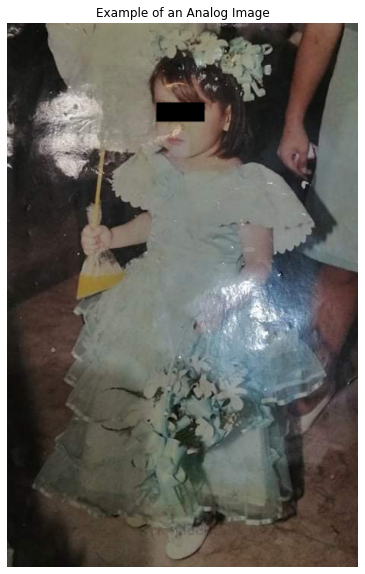

In [2]:
def show_analog_image(image_path):
    # Load the image
    image = imread(image_path)

    # Display the image
    plt.figure(figsize=(15,10))
    plt.imshow(image)
    plt.title("Example of an Analog Image")
    plt.axis('off')
    plt.show()

show_analog_image('02_Analog.png')

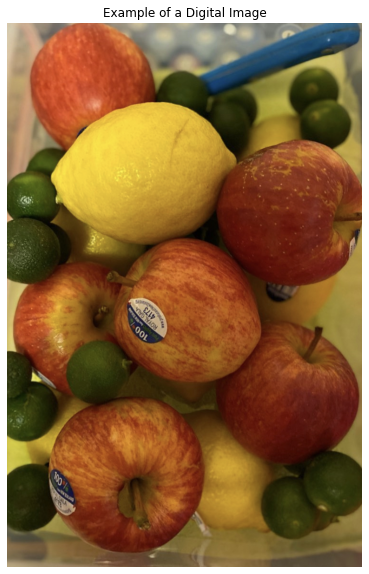

In [3]:
def show_digital_image(image_path):
    # Load the image
    image = imread(image_path)

    # Display the image
    plt.figure(figsize=(15,10))
    plt.imshow(image)
    plt.title("Example of a Digital Image")
    plt.axis('off')
    plt.show()
    
show_digital_image('03_Fruits.jpg')

---
<h2 style="color:#ff0090">B. Digitalization of Images</h2>


Analog images, such as my old flower girl photo or other family or historical documents, can degrade over time due to natural aging or exposure to environmental factors. But what if we have a collection of analog images that we want to process digitally? That’s where digitalization of images comes in.

**Digitalization of images** is the process of converting analog images to digital format, which allows them to be edited and processed using digital tools. This includes two important concepts: sampling and quantization.

**B1. Sampling** is the process of capturing the spatial information of an image. It is like taking a snapshot of the analog image and turning it into a digital image made up of pixels. The more pixels there are in the digital image, the more detailed the image will be.

To demonstrate the effects of image sampling on image quality and size, let’s try upsampling and downsampling the originally analog photo.

**B1.1 Upsampling**:

Upsampling is a technique that adds extra pixels between existing ones, determining the new pixel values based on the neighboring pixels. It is commonly used to enhance the level of detail and sharpness in an image.

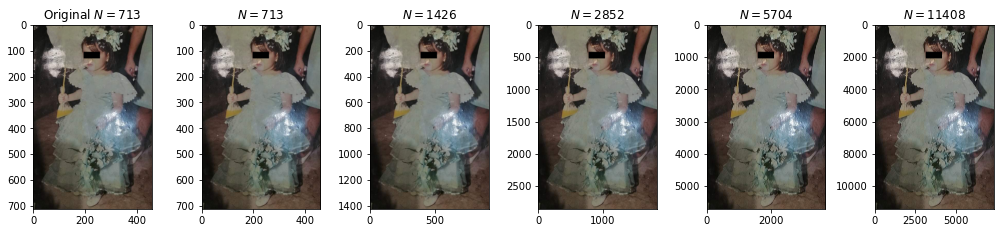

In [4]:
def upsample_image(image_path, factor=2):
    """Takes in the image path and the upsample factor to return an 
    upsampled image.
    """
    # Load the original image
    img = imread(image_path)

    # Upsample the image by a factor of `factor`, default `factor`=2 
    factors = factor**np.arange(0, 5)

    # Create a subplot for each upsampled image
    fig, ax = plt.subplots(1, len(factors)+1, figsize=(14, 4))

    # Display the original image
    ax[0].imshow(img)
    ax[0].set_title(r'Original $N=%d$' % img.shape[0])

    # Loop over each upsampling factor and upsample the image
    for i, factor in enumerate(factors):
        # Upsample the image using the current factor
        image = resize(img, (img.shape[0]*factor, img.shape[1]*factor), 
                       anti_aliasing=True)

        # Determine the axis number for this subplot
        ax_num = i + 1

        # Display the upsampled image on the corresponding subplot
        ax[ax_num].imshow(image)

        # Set the subplot title to the size of the upsampled image
        ax[ax_num].set_title(r'$N=%d$' % image.shape[0])

    # Adjust the layout of the subplots to prevent overlap
    plt.tight_layout()

    # Show the final plot
    plt.show()

# Upsample an image
upsample_image('02_Analog.png')

Output: The first subplot on the left displays the original image, while the succeeding subplots show the upsampled images from the rightmost (N=11408) to the second subplot (N=713). The title of each upsampled image subplot specifies its corresponding size. (Image by Author)

In the code above, the image was upsampled by a factor of 2 for each iteration of the loop using the resize() function. Despite the increase in pixel count, the improvement in the image was not significant. This may be due to the lack of detail in the original image, making it difficult to reveal any new information even after upsampling. Additionally, factors such as screen resolution and color accuracy affected how the image appears, potentially influencing the perceived improvement. It’s important to note that upsampling can introduce noise and artifacts so it is recommended to upsample moderately. Despite this, upsampling can be a useful technique for image processing tasks such as image interpolation, image super-resolution, and improving image quality.

To better illustrate the effect of sampling, let's try the opposite of upsampling - **downsampling**.

**B1.2 Downsampling:**

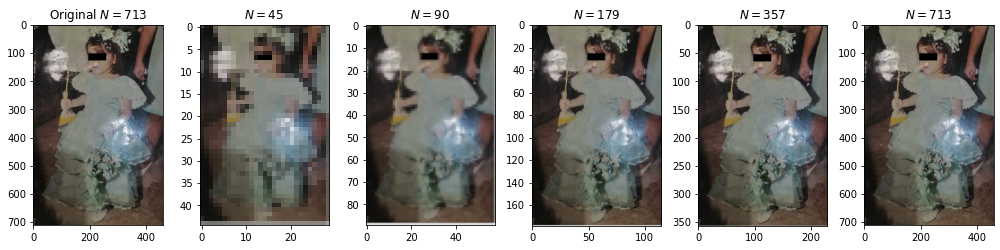

In [5]:
def downsample_image(image_path, factor=2):
    """Takes in the image path and the downsample factor to return an 
    downsampled image.
    """
    # Load the original image
    img = imread(image_path)

    # Sample the image by a factor 
    factors = factor**np.arange(0, 5)

    # Create a subplot for each sampled image
    fig, ax = plt.subplots(1, len(factors)+1, figsize=(14, 4))

    # Display the original image
    ax[0].imshow(img)
    ax[0].set_title(r'Original $N=%d$' % img.shape[0])

    # Loop over each sampling factor and sample the image
    for i, factor in enumerate(factors):
        # Sample the image using the current factor
        image = downscale_local_mean(img, 
                                     factors=(factor, 
                                              factor, 
                                              1)).astype(int)

        # Determine the axis number for this subplot
        ax_num = len(factors) - i

        # Display the sampled image on the corresponding subplot
        ax[ax_num].imshow(image)

        # Set the subplot title to the size of the sampled image
        ax[ax_num].set_title(r'$N=%d$' % image.shape[0])

    
    # Adjust the layout of the subplots to prevent overlap
    plt.tight_layout()

    # Show the final plot
    plt.show()
    
# Downsample an image
downsample_image('02_analog.png')

Output: The first subplot on the left displays the original image, while the succeeding subplots show the downsampled images from the rightmost (N=713) to the second subplot (N=45). The title of each downsampled image subplot specifies its corresponding size. (Image by Author)

The resulting images from the code illustrate how downsampling works — as we squeeze the original image to smaller and smaller sizes, we inevitably lose some of its finer details and features. Yet, even with a reduced size of N=179, the image is still recognizable. By using downsampling, I was able to reduce computational complexity and improve storage and transmission efficiency: the fewer the number of pixels, the faster the processing time and lower the computational requirements, and the less storage space required. This allows images to be transmitted more quickly over networks, which is crucial for applications with limited bandwidth or storage capacity.

It is essential to recognize that the effectiveness of downsampling an image is contingent upon the specific goals and demands of the image’s application. In some instances, reducing an image’s size might be sufficient for a given task, whereas in other cases, a higher resolution could be necessary. Ultimately, it comes down to striking a balance between image quality and size based on your preferences and requirements.

**B2. Quantization**

**Quantization** is the process of converting the continuous range of pixel intensities into discrete values. It is like assigning a color to each pixel in the digital image. It involves taking the continuous colors in the original image and converting them into a set of specific, discrete color values. This helps make sure that the digital image accurately reflects the original image’s colors.

To illustrate, let’s perform quantization to my flower girl photo again:

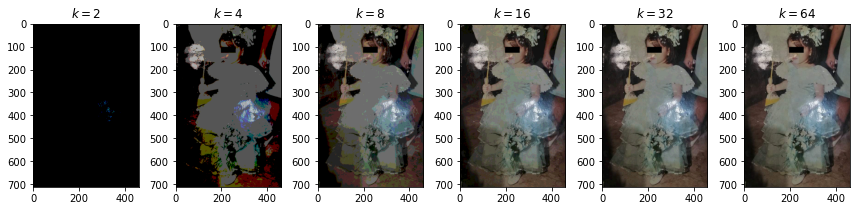

In [6]:
def quantize_image(image_path, k_values):
    """
    Perform quantization on an image using different values of k.

    Parameters:
        image_path (str): The path to the image file.
        k_values (list): A list of k values to be used for quantization.
    """
    # Load the original image
    img = imread(image_path)

    # Create subplots for different k values
    fig, ax = plt.subplots(1, len(k_values), figsize=(12, 4))

    for i, k in enumerate(k_values):
        # Create k bins of equal width between 0 and the maximum intensity value
        bins = np.linspace(0, img.max(), k)

        # Map the pixel values of the original image to the nearest bin
        quantized_image = np.digitize(img, bins)

        # Convert the binned values back to the original range of intensity values
        reconstructed_image = (np.vectorize(bins
                                            .tolist()
                                            .__getitem__)(quantized_image-1)
                                 .astype(int))

        # Display the quantized image with title showing the number of bins (k)
        ax[i].imshow(reconstructed_image)
        ax[i].set_title(r'$k = %d$' % k)

    # Adjust the layout of the subplots to prevent overlap
    plt.tight_layout()

    # Show the final plot
    plt.show()

# Quantize the image
k_values = [ 2,  4,  8, 16, 32, 64]
quantize_image('02_analog.png', k_values)

Output: The title of each quantized image subplot specifies its corresponding size. (Image by Author)

The code above involves dividing the range of pixel intensities into a fixed number of bins, each representing a specific range of intensity values. By assigning each pixel to the nearest bin, I converted the continuous range of pixel values into a set of discrete values, effectively reducing the number of colors present in the image. In the code above, I used the numpy function <b>digitize</b> to perform this mapping from continuous to discrete values.

After quantization, I converted the binned values back to the original range of intensity values so that the digital image accurately reflects the colors of the original image. This was done by using vectorize to map each binned value to its corresponding intensity value, which was then cast back to an integer value.

The resulting images display the image in varying levels of color complexity, with fewer colors present as the number of bins decreases. *By controlling the number of bins used in quantization, we can control the level of detail and color complexity in the resulting image, enabling us to enhance and manipulate digital images in countless ways. For example, we can increase the number of bins to enhance the image’s details and create a more realistic representation, or decrease the number of bins to create a more abstract or simplified image.*

Together, sampling and quantization can take old analog photos and turn them into high-quality digital images that can be preserved, enhanced, and shared with others. And with advances in digital image processing technology, there’s no limit to what can be done with these images.

---
<h2 style="color:#ff0090">C. Representation, Types, and Formats of Digital Images</h2>


As previously mentioned, <b>digital images</b> are composed of individual elements called <b>pixels</b>, each representing a specific color or intensity value. The resolution of an image depends on the number of pixels in the image.



<b>Types</b>: 

Think of image types as different flavors of ice cream, each with its unique characteristics and applications. We have Binary, Grayscale, and Color images — choose your scoop!🍦

- Binary Images
- Grayscale Images
- Color Images

To demonstrate these types of images, let’s start with Binary and Grayscale images:

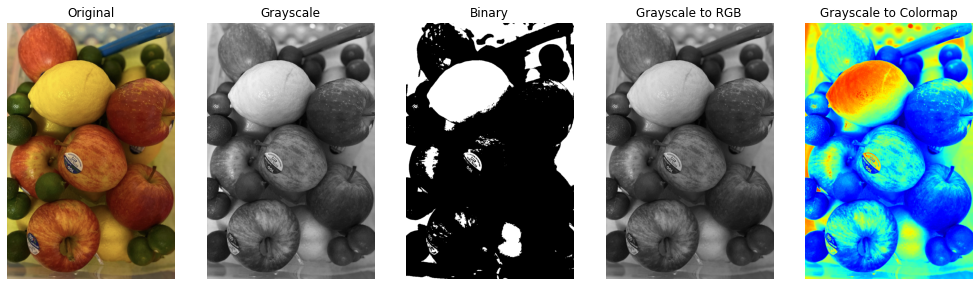

In [7]:
def show_image_color_types(image_path):
    """
    Load an image and display it in different color representations.

    Parameters:
        image_path (str): The path to the image file.

    Returns:
        None
    """
    # Load the original image
    img = imread(image_path)

    # Convert the image to grayscale
    grayscale = rgb2gray(img)

    # Convert the grayscale image to binary
    binary = img_as_uint(grayscale > 0.5)

    # Convert the grayscale image to color
    color = gray2rgb(grayscale)

    # Apply the jet colormap
    img_colored = plt.cm.jet(grayscale)

    # Plot the images
    fig, ax = plt.subplots(1, 5, figsize=(14, 4))
    ax[0].imshow(img)
    ax[0].set_title('Original')
    ax[1].imshow(grayscale, cmap='gray')
    ax[1].set_title('Grayscale')
    ax[2].imshow(binary, cmap='gray')
    ax[2].set_title('Binary')
    ax[3].imshow(color)
    ax[3].set_title('Grayscale to RGB')
    ax[4].imshow(img_colored)
    ax[4].set_title('Grayscale to Colormap')

    for ax in fig.axes:
        ax.axis('off')
    plt.tight_layout()
    plt.show()


show_image_color_types('03_Fruits.jpg')

Fruits image in various types (Image taken and processed by the author)

Let’s take a closer look at the four versions of the fruits image I just created: grayscale, binary, RGB, and colormap.

Starting with the <b>grayscale image</b>, we can see that it is a black and white representation of the original image, where the shades of gray correspond to the intensity values of the original image. By converting the image to grayscale, we’ve effectively reduced the amount of color information present in the image, which can be beneficial for certain image processing tasks. Further, the grayscale version still retains much of the detail and information from the original image, allowing us to analyze and manipulate the image in various ways.

Moving on to the <b>binary image</b>, we can see that it is a stark black and white representation of the original image. This conversion was achieved by setting a threshold value, above which all pixels are set to white and below which all pixels are set to black. In our case, we set the threshold value to 0.5, which resulted in a binary image with reds turning to blacks and yellows/lighter colors turning to white. Binary images can be useful for certain image processing tasks, such as edge detection and object recognition, as they simplify the image to its most essential features.

In converting grayscale image to color image, two of the common methods used are:

<b>Grayscale to RGB conversion</b> which simply replicates the grayscale values across all three color channels to create an RGB image. This creates a grayscale-like color image that may not have the same color richness as a true color image.

<b>Color map</b> involves mapping the grayscale values to specific colors in a color map. This allows for a more customized colorization of the image, but may result in a less natural-looking color image as evidenced by the rightmost image.

*Converting an image to color can enhance the visual appeal of the image and improve their suitability for data visualization. However, it is important to note that in cases where two objects have similar grayscale values, as in the fruits example where apple and calamansi have the same grayscale color, it can be challenging to distinguish them in the resulting color image.*

To know more about colors, let’s dive into the world of color spaces!

---
<h2 style="color:#ff0090">D. Color Spaces: RGB and HSV</h2>

In digital images, <b>color</b> is represented using various color models or color spaces, the most common of which are <b>RGB (red, green, blue)</b> and <b>HSV (hue, saturation, value)</b>.

<b>RGB</b> is the most widely used color space, and it represents each color as a combination of red, green, and blue light. By varying the intensity of each of these three primary colors, we can create a wide range of colors. This color space is well-suited for displays that use additive color mixing, such as computer monitors and televisions.

<b>HSV</b>, on the other hand, represents colors in terms of hue, saturation, and value. It is an alternative color space that separates the chromatic information (hue) from the luminance information (value).

To illustrate RGB and HSV, let’s convert the fruits image to the HSV color space and display its channels as follows:

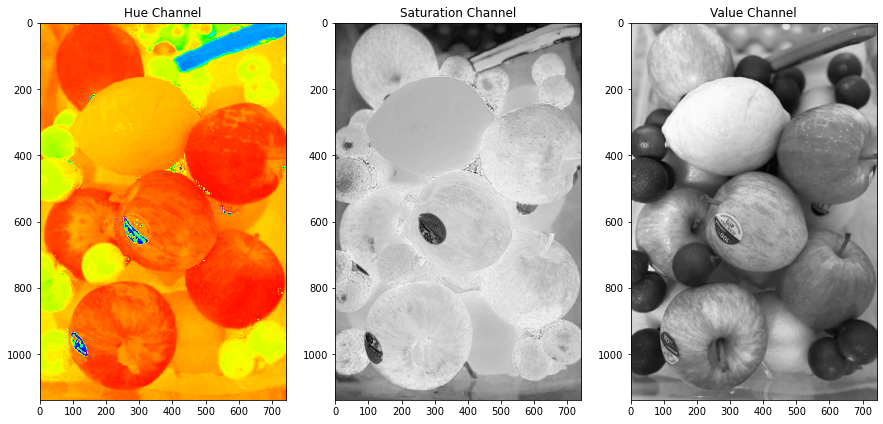

In [8]:
def show_hsv_channels(image_path):
    """
    Load an image and display its HSV channels.

    Parameters:
        image_path (str): The path to the image file.

    Returns:
        None
    """
    # Load the image
    img = imread(image_path)

    # Convert the image to HSV color space
    hsv_image = rgb2hsv(img)

    # Display the HSV channels
    fig, axs = plt.subplots(1, 3, figsize=(15, 8))
    axs[0].imshow(hsv_image[:, :, 0], cmap='hsv')
    axs[0].set_title('Hue Channel')
    axs[1].imshow(hsv_image[:, :, 1], cmap='gray')
    axs[1].set_title('Saturation Channel')
    axs[2].imshow(hsv_image[:, :, 2], cmap='gray')
    axs[2].set_title('Value Channel')
    plt.show()

show_hsv_channels('03_Fruits.jpg')

HSV Color Space (Image taken and processed by the author).

The code above converts the fruits image from the RGB color space to the HSV color space using the rgb2hsv function from the skimage.color module. It then displays the hue, saturation, and value channels of the resulting HSV image using subplots.

The <b>hue</b> channel displays the actual colors in the image, with different colors represented by different shades of gray.

The <b>saturation</b> channel represents the intensity or purity of the colors, with highly saturated colors appearing as bright white and unsaturated colors appearing as dark gray.

The <b>value</b> channel represents the brightness or lightness of the colors, with brighter colors appearing as white and darker colors appearing as black.

On the other hand, to convert an image in HSV space back to RGB, use `hsv2rgb`.

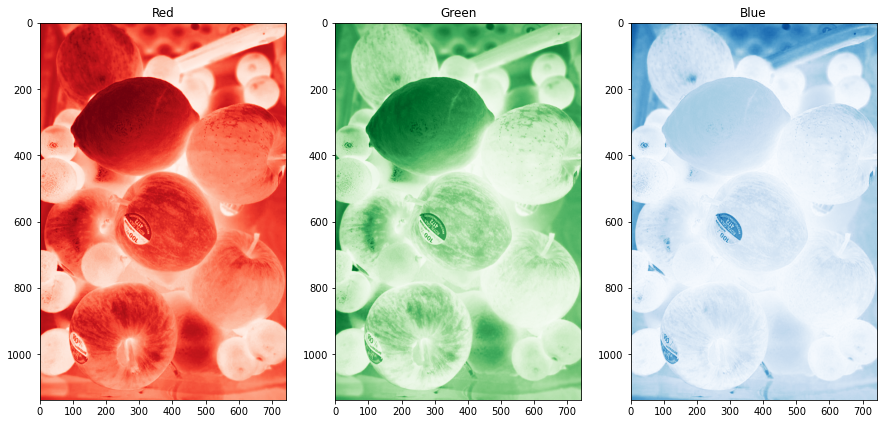

In [9]:
def show_rgb_channels(image_path):
    """
    Load an image and display its RGB channels.

    Parameters:
        image_path (str): The path to the image file.

    Returns:
        None
    """
    # Load the image
    img = imread(image_path)

    # Convert the image to HSV color space
    hsv_image = rgb2hsv(img)

    # Convert the HSV image back to RGB
    hsv_to_rgb = hsv2rgb(hsv_image)

    # Display the RGB channels
    fig, ax = plt.subplots(1, 3, figsize=(15, 8))
    ax[0].imshow(hsv_to_rgb[:, :, 0], cmap='Reds')
    ax[0].set_title('Red')
    ax[1].imshow(hsv_to_rgb[:, :, 1], cmap='Greens')
    ax[1].set_title('Green')
    ax[2].imshow(hsv_to_rgb[:, :, 2], cmap='Blues')
    ax[2].set_title('Blue')
    plt.show()
show_rgb_channels('03_Fruits.jpg')

RGB Color Space (Image taken and processed by the author).

The code above takes the previously converted fruits image from RGB to HSV color space and converts it back to RGB using the hsv2rgb function from the skimage.color library. It then displays the resulting RGB channels as separate images using the subplots and imshow functions.

The resulting RGB images show the fruits in different color channels, with reds in the first subplot, greens in the second, and blues in the third. This decomposition of the image into its individual color channels can be useful for analyzing and manipulating the image, as well as for data visualization purposes.

---
<h2 style="color:#ff0090">Conclusion</h2>

In this blog post, we’ve delved into the captivating world of image processing, exploring its fundamentals and shedding light on the magic that turns pixels into visually stunning masterpieces. As a quick recap, here are some key takeaways:

Image processing is an essential aspect of modern technology, enabling us to manipulate and analyze images with greater efficiency and creativity.

We used two types of images: Analog and digital to perform image processing techniques.
Digital images are represented as matrices with varying levels of complexity, depending on their type (binary, grayscale, or color).

Sampling and quantization help us manage the size and complexity of digital images, while preserving their core visual features.

Color spaces like RGB and HSV define how colors are represented and manipulated in digital images, with each having its own unique advantages.

As we wrap up this first episode, it is important to remember that this is just the beginning. There’s so much more to uncover in the vast realm of image processing, and I encourage you to continue exploring its many techniques and applications. With every new insight, you’ll be one step closer to becoming a digital maestro, painting the world with code and innate creativity. So buckle up and get ready to join me on this adventure as we explore more exciting techniques in the upcoming episodes!

---
<h2 style="color:#ff0090">References</h2>


- Gonzalez, R. C., & Woods, R. E. (2018). Digital Image Processing. Pearson.
- Borja, B. (2023). Lecture 1: Introduction to Digital Images [Jupyter Notebook]. Introduction to Image Processing 2023, Asian Institute of Management.